# Business Understanding
## Doel van de opdracht
Het bijhouden en inzichtelijk maken van verandering in landgebruik (landuse) is van groot belang. Is er bijvoorbeeld een afname in de hoeveelheid land wat geschikt is voor landbouw, of een toename in de afmetingen van een bepaalde sloppenwijk. Het veld in gaan en dit soort dingen met de hand inmeten is een tijdrovende klus, dus is het doel in deze analyse om een model te maken die dit voor ons kan doen op basis van satellietbeelden.
## Situatie
We hebben twee datasets ontvangen, een training set. Een labelset en een geanalyseerde set.
## Data mining doelen
Geen, de data hebben we al. Het wordt alleen het analyseren daarvan.
## Project plan
Data analyse van de les uitvoeren op deze datasets.

# Data understanding
De klant heeft `specral_data.pkl` bestand met daarin data van een sateliet. Daarnaast is er ook een `ground_truth.pkl` bestand met labels gerelateerd aan die sateliet data.

In [276]:
# import stuff
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.svm import l1_min_c
import numpy as np
ground_df = pd.read_pickle("ground_truth.pkl")
spectral_df = pd.read_pickle("spectral_data.pkl")


## Ground_truth.pkl

`ground_truth.pkl:`

`x` = de x-coordinaat op basis van de sateliet

`y` = de y-coordinaat op basis van de sateliet

`category` = het label/grondsoort dat de coordinaat in werkelijkheid heeft.

In [277]:
ground_df.sample(5)

,x,y,category
111074,362,248,trees
72834,238,76,trees
27563,90,241,trees
97467,318,149,road
196376,640,204,trees


In [278]:
ground_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 392960 entries, 0 to 392959
Data columns (total 3 columns):
 #   Column    Non-Null Count   Dtype 
---  ------    --------------   ----- 
 0   x         392960 non-null  int64 
 1   y         392960 non-null  int64 
 2   category  392960 non-null  object
dtypes: int64(2), object(1)
memory usage: 9.0+ MB



**Hieronder zie je een visualisatie van de x-y coordinaten van de eerste 400000 coordianten op een scatterplot:**

<AxesSubplot:xlabel='x', ylabel='y'>

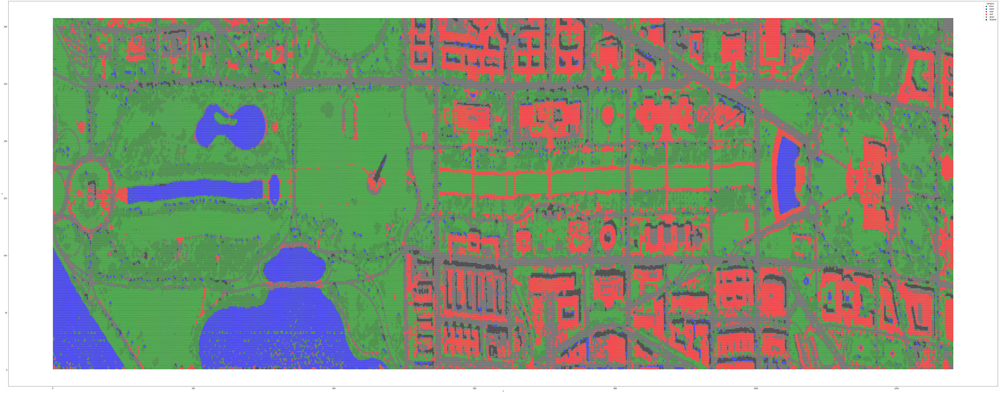

In [279]:
plt.figure(figsize=(100, 40))
palette = {
    "trees": "darkgreen",
    "road" : "#3D3D3D",
    "roof" : "red",
    "shadow" : "black",
    "water" : "blue",
    "grass" : "green"
}
sns.scatterplot(data=ground_df, x="x", y="y", hue="category", palette= palette)

In [280]:
amount = 400
spectral_df_am = spectral_df[:amount]
ground_df_cat = ground_df["category"][:amount]

## Spectral_data.pkl

`spectral_data.pkl:`

`x` = de x-coordinaat op basis van de sateliet

`y` = de y-coordinaat op basis van de sateliet

`1-191` = golflengten die de satelite waarschijnlijk oppikt.

In [281]:
merge = ground_df.merge(spectral_df)
merge.head(5)

,x,y,category,1,2,3,4,5,6,7,...,182,183,184,185,186,187,188,189,190,191
0,1,1,trees,3007,2785,2709,2751,2612,2633,2559,...,0,1,1,0,0,0,-1,3,0,0
1,1,2,trees,3328,3151,3078,3012,3040,2903,2769,...,1,1,1,1,0,0,0,1,0,0
2,1,3,water,3229,3243,3067,3040,3016,2948,2829,...,2,2,0,1,0,0,3,-1,0,1
3,1,4,water,3250,3186,3049,3036,2949,2936,2823,...,1,1,0,1,1,1,0,0,1,2
4,1,5,water,3082,3141,3010,3056,3018,2976,2869,...,1,0,1,0,0,1,0,2,0,0


<AxesSubplot:ylabel='category'>

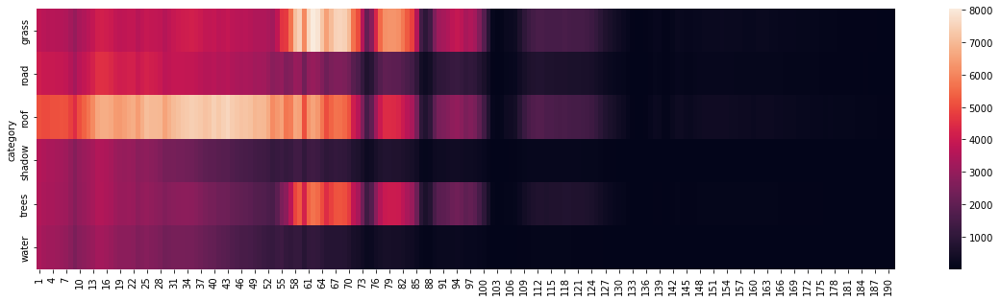

In [282]:
spectral_category = merge.groupby(["category"]).mean()
spectral_category.drop("x", axis=1, inplace=True)
spectral_category.drop("y", axis=1, inplace=True)
plt.figure(figsize=(20, 5))
sns.heatmap(spectral_category)

In [283]:
spectral_df.head(5)

band,x,y,1,2,3,4,5,6,7,8,...,182,183,184,185,186,187,188,189,190,191
0,1,1,3007,2785,2709,2751,2612,2633,2559,2372,...,0,1,1,0,0,0,-1,3,0,0
1,1,2,3328,3151,3078,3012,3040,2903,2769,2598,...,1,1,1,1,0,0,0,1,0,0
2,1,3,3229,3243,3067,3040,3016,2948,2829,2611,...,2,2,0,1,0,0,3,-1,0,1
3,1,4,3250,3186,3049,3036,2949,2936,2823,2586,...,1,1,0,1,1,1,0,0,1,2
4,1,5,3082,3141,3010,3056,3018,2976,2869,2654,...,1,0,1,0,0,1,0,2,0,0


In [284]:
spectral_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 392960 entries, 0 to 392959
Columns: 193 entries, x to 191
dtypes: int16(191), int64(2)
memory usage: 149.2 MB


# Data preparation

In [285]:
amount = 100

## Percentage based merge

In [286]:
categories_sum = merge.groupby("category").count()

total_rows = len(merge)
category_percentage = categories_sum["x"] / total_rows * amount
category_percentage = category_percentage.to_frame()
category_percentage = category_percentage.astype(int)
category_percentage

,x
category,
grass,32
road,19
roof,15
shadow,3
trees,21
water,7


In [287]:
spectral_copy = merge.copy()
random_percentage_categories = spectral_copy.iloc[0:0]
count = 0
# do a loop for every category
for i, row in category_percentage.iterrows():
    category = i
    percentage_amount = int(row["x"])
    
    category_items = merge.loc[merge['category'] == category]
    random_percentage_categories = pd.concat([random_percentage_categories, category_items.sample(percentage_amount)])
random_percentage_categories

,x,y,category,1,2,3,4,5,6,7,...,182,183,184,185,186,187,188,189,190,191
139054,453,291,grass,3768,3616,3560,3510,3492,3445,3288,...,44,33,23,33,27,24,14,17,14,9
126449,412,273,grass,4066,4067,4036,4019,3852,3988,3973,...,69,53,40,53,47,42,25,34,23,16
336465,1096,301,grass,4002,3821,3740,3688,3729,3628,3637,...,35,29,24,27,23,23,13,17,13,9
160495,523,242,grass,3533,3451,3307,3365,3340,3241,3202,...,60,48,37,44,40,34,23,28,15,17
200015,652,159,grass,3889,3689,3753,3751,3698,3593,3475,...,81,65,51,61,53,47,26,39,29,18
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
69094,226,20,water,3281,3129,3080,3091,3034,2953,2884,...,0,0,1,-1,3,2,0,1,1,1
113679,371,90,water,3339,3195,3209,3267,3105,3128,3066,...,2,2,2,2,3,2,0,2,2,1
122507,400,15,water,3368,3250,3124,3175,3122,3103,2967,...,0,2,0,1,1,0,0,2,0,0
11989,40,17,water,3293,3290,3023,3058,3022,2910,2875,...,2,1,0,1,2,2,0,3,1,1


In [288]:
random_cat_sum = random_percentage_categories.groupby("category").count()

random_cat_total_rows = len(random_percentage_categories)
random_percentage_percentages = random_cat_sum["x"] / random_cat_total_rows
random_percentage_percentages

random_percentage_check = random_percentage_percentages * amount
random_percentage_check = random_percentage_check.to_frame()
random_percentage_check = random_percentage_check.astype(int)
random_percentage_check

,x
category,
grass,32
road,19
roof,15
shadow,3
trees,21
water,7


In [289]:
percentage_spectral = random_percentage_categories.drop(["x", "y", "category"], axis=1)
percentage_labels = random_percentage_categories["category"]
percentage_labels

139054    grass
126449    grass
336465    grass
160495    grass
200015    grass
          ...  
69094     water
113679    water
122507    water
11989     water
70345     water
Name: category, Length: 97, dtype: object

## Balanced based model

In [290]:
spectral_copy = merge.copy()
categories = merge["category"].unique()
balanced_amount = int(amount / len(categories))

random_balanced_categories = spectral_copy.iloc[0:0]

# do a loop for every category
for category in categories:
    category_items = merge.loc[merge['category'] == category]
    random_balanced_categories = pd.concat([random_balanced_categories, category_items.sample(balanced_amount)])
random_balanced_categories

,x,y,category,1,2,3,4,5,6,7,...,182,183,184,185,186,187,188,189,190,191
384465,1253,102,trees,4399,4152,4239,4297,4227,4228,4222,...,64,52,40,48,44,40,24,33,28,16
28816,94,266,trees,3443,3227,3186,3182,3161,3088,2995,...,12,10,6,8,8,8,6,5,5,4
391580,1276,156,trees,3427,3343,3278,3239,3233,3111,3058,...,14,12,9,9,11,9,6,8,5,6
91435,298,257,trees,3572,3473,3404,3410,3326,3261,3265,...,19,12,12,13,12,12,7,12,5,6
355751,1159,246,trees,3390,3281,3163,3175,3150,3039,2965,...,16,12,10,9,9,9,7,7,7,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
225691,736,47,shadow,3471,3214,3152,3122,3099,3055,2975,...,7,5,4,3,4,6,4,2,4,4
279793,912,117,shadow,3797,3754,3690,3747,3690,3669,3572,...,32,24,21,26,21,22,14,19,15,10
245018,799,33,shadow,3382,3258,3167,3152,3018,3067,2940,...,4,3,2,5,2,5,1,3,4,1
221123,721,84,shadow,3348,3204,3136,3213,3154,3138,3032,...,9,8,5,8,7,6,5,7,6,7


### check

In [291]:
random_cat_sum = random_balanced_categories.groupby("category").count()

random_cat_total_rows = len(random_balanced_categories)
random_balanced_percentages = random_cat_sum["x"] / random_cat_total_rows
random_balanced_percentages

random_balanced_check = random_balanced_percentages * amount
random_balanced_check = random_balanced_check.to_frame()
random_balanced_check = random_balanced_check.astype(int)
random_balanced_check

,x
category,
grass,16
road,16
roof,16
shadow,16
trees,16
water,16


In [292]:
balanced_spectral = random_balanced_categories.drop(["x", "y", "category"], axis=1)
balanced_labels = random_balanced_categories["category"]
balanced_labels

384465     trees
28816      trees
391580     trees
91435      trees
355751     trees
           ...  
225691    shadow
279793    shadow
245018    shadow
221123    shadow
203265    shadow
Name: category, Length: 96, dtype: object

# Modeling

## Percentage based model

In [293]:
from sklearn.linear_model import LogisticRegression

base_log_reg = LogisticRegression(penalty='l1', 
                                   multi_class='ovr',
                                   solver='saga', 
                                   max_iter=int(1e4), 
                                   C=1).fit(percentage_spectral, percentage_labels)

base_log_reg.score(percentage_spectral, percentage_labels)

0.8969072164948454

In [294]:
cs = l1_min_c(percentage_spectral, percentage_labels, loss='log') * np.logspace(0, 7, 16)
cs

array([3.64365094e-06, 1.06709585e-05, 3.12514447e-05, 9.15243735e-05,
       2.68042359e-04, 7.85000798e-04, 2.29898832e-03, 6.73291965e-03,
       1.97183285e-02, 5.77479757e-02, 1.69123295e-01, 4.95302019e-01,
       1.45056357e+00, 4.24818510e+00, 1.24414242e+01, 3.64365094e+01])

In [295]:
np.log10(1/cs) # Uitdrukken in regularisatie kracht en niet in C. Log10 ivm leesbaarheid

array([ 5.43846324,  4.97179657,  4.5051299 ,  4.03846324,  3.57179657,
        3.1051299 ,  2.63846324,  2.17179657,  1.7051299 ,  1.23846324,
        0.77179657,  0.3051299 , -0.16153676, -0.62820343, -1.0948701 ,
       -1.56153676])

In [296]:
from sklearn.linear_model import LogisticRegressionCV #let op
base_log_regCV = LogisticRegressionCV(penalty='l1', 
                                   multi_class='ovr',
                                   solver='saga', 
                                   max_iter=int(1e4), 
                                   Cs=cs).fit(percentage_spectral, percentage_labels)

base_log_regCV.score(percentage_spectral, percentage_labels)

/Users/sebastiaankolmschate/opt/anaconda3/lib/python3.9/site-packages/sklearn/model_selection/_split.py:676: UserWarning: The least populated class in y has only 3 members, which is less than n_splits=5.
  warnings.warn(


0.8762886597938144

In [297]:
np.log10(1/base_log_regCV.C_)

array([3.1051299 , 2.17179657, 3.1051299 , 2.17179657, 2.63846324,
       2.63846324])

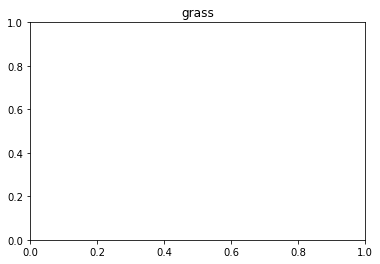

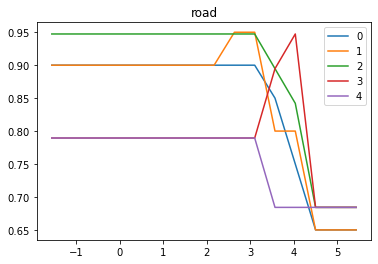

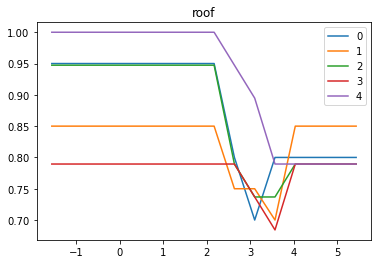

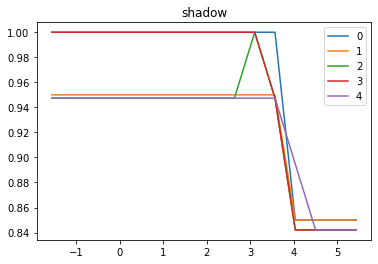

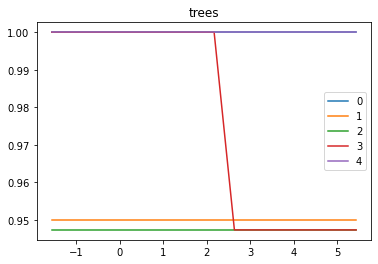

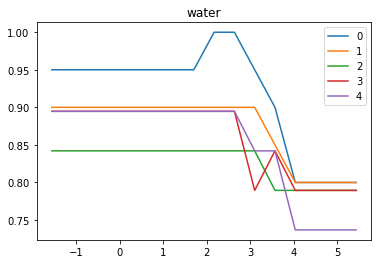

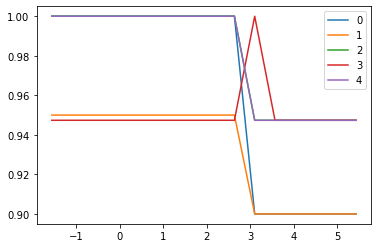

In [298]:
for category in base_log_regCV.scores_:
    plt.title(category)
    pd.DataFrame(base_log_regCV.scores_[category].T, index=np.log10(1/(cs))).plot()

## Balanced model

In [299]:
from sklearn.linear_model import LogisticRegression

base_log_reg = LogisticRegression(penalty='l1', 
                                   multi_class='ovr',
                                   solver='saga', 
                                   max_iter=int(1e4), 
                                   C=1).fit(balanced_spectral, balanced_labels)

base_log_reg.score(balanced_spectral, balanced_labels)

0.8958333333333334

In [300]:
cs = l1_min_c(balanced_spectral, balanced_labels, loss='log') * np.logspace(0, 7, 16)
cs

array([5.15958599e-06, 1.51105935e-05, 4.42535575e-05, 1.29602941e-04,
       3.79560947e-04, 1.11159911e-03, 3.25547868e-03, 9.53413994e-03,
       2.79221071e-02, 8.17739272e-02, 2.39486767e-01, 7.01371620e-01,
       2.05406818e+00, 6.01563562e+00, 1.76176585e+01, 5.15958599e+01])

In [301]:
from sklearn.linear_model import LogisticRegressionCV #let op
base_log_regCV = LogisticRegressionCV(penalty='l1', 
                                   multi_class='ovr',
                                   solver='saga', 
                                   max_iter=int(1e4), 
                                   Cs=cs).fit(balanced_spectral, balanced_labels)

base_log_regCV.score(balanced_spectral, balanced_labels)

0.78125

In [302]:
np.log10(1/base_log_regCV.C_)

array([1.55405181, 5.28738514, 3.42071848, 2.02071848, 2.02071848,
       2.48738514])

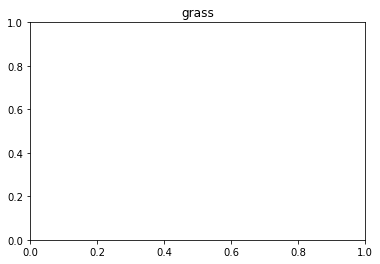

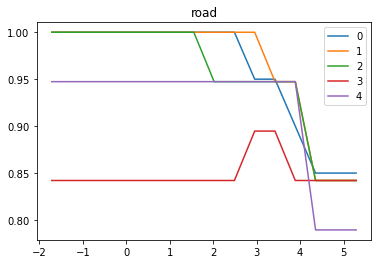

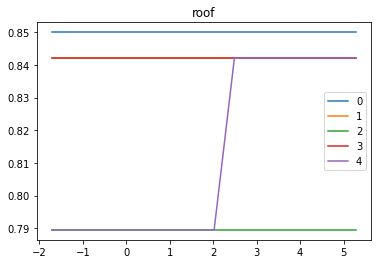

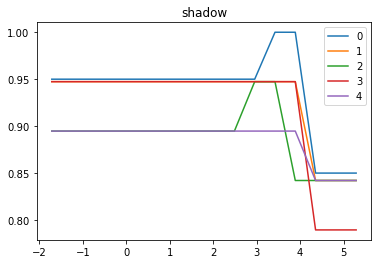

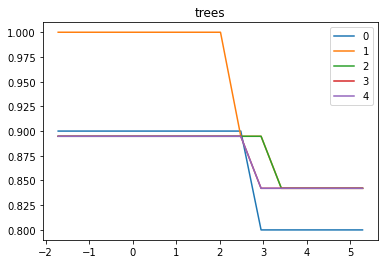

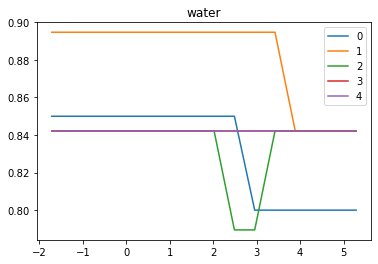

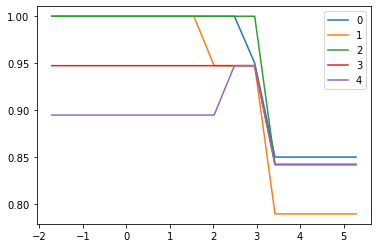

In [303]:
for category in base_log_regCV.scores_:
    plt.title(category)
    pd.DataFrame(base_log_regCV.scores_[category].T, index=np.log10(1/(cs))).plot()